### Step 3: Quasi-equiareal spherical parameterization of a genus-0 surface, $S_{\text{ref}}(x,y,z)$ 

Any genus-0 surface can be mapped to the unit sphere by minimizing conformal error. This necessarily means shrinking surface protrusions to point-like singularities. This detrimentally affects the representation of high curvature surface protrusions when mapped to the sphere. For  cells whose reference shape is of branched morphology, this necessarily means complete under-representation of the branches and almost surely any surface protrusions displayed on the branches.

Consequently, it is **imperative** to recover area-distortion, if the objective is to analyze surface protrusions. This is the objective of Step 3.

The u-Unwrap3D area-distortion relaxation scheme adapts and improves the approach of [Lee et al.](https://www.cs.jhu.edu/~misha/MyPapers/SGP19.pdf), to relax distortion directly on the sphere iteratively to achieve near-ideal area-distortion minimization. Theoretically any genus-0 surface should be relaxable. Practically, we are beholden to the limitations of computer precision, such that optimal area-distortion is achievable if users construct or modify $S_{\text{ref}}(x,y,z)$ to satisfy the following: $S_{\text{ref}}(x,y,z)$ should not have i) sharp features, ii) be isotropically meshed, iii) not have thin necks, and iv) not be too densely meshed. All 4 of these criteria is to allow for the area distortion to be 'diffused'. i), iii) are ensured by dilating the shape and remeshing, as described in Step 1. ii), iv) is achieved by isotropic remeshing to achieve a desired average edge length.    

**Note on the tradeoff of conformal and equiareal distortion:**  For a closed 3D surface, it is not possible to jointly minimize conformal and equiareal distortion like a seesaw - improving one necessarily increases the other error. Conformal maps preserve local angles - this has many nice mathematical properties such as being able to apply calculus. Meanwhile, equiareal maps are required to properly represent surface protrusions but comes at the cost of potentially greatly distorting local orientation. Consequently u-Unwrap3D has designed an iterative relaxation procedure so that users can adjust the degree of relaxation based on their desired objective e.g. minimize up to a certain target error, achieve an isometric map that balances conformal and area distortion etc.       


#### 1. Load $S_{\text{ref}}(x,y,z)$  and $S_{\text{ref}}^{\mathcal{Q}}(x,y,z)$ mesh

We assume the user has worked through step 2 which generates and saves the conformal spherical parameterization, $S_{\text{ref}}^{\mathcal{Q}}(x,y,z)$ of the genus-0 reference surface, $S_{\text{ref}}(x,y,z)$ of an input cell surface mesh to the folder `example_results/bleb_example/step2_conformal_sphere_param`. We also need the reference surface mesh, $S_{\text{ref}}(x,y,z)$ which was computed in step 1 and was saved to the folder `example_results/bleb_example/step1_cMCF_reference`. Moreover these surface has been colored by mean curvature of $S(x,y,z)$. 

In [14]:
import unwrap3D.Utility_Functions.file_io as fio
import unwrap3D.Mesh.meshtools as meshtools
import numpy as np
import os 
import scipy.io as spio

# example cell used
imgfolder = '../../example_data/img'
imgfile = os.path.join(imgfolder, 'bleb_example.tif')
basefname = os.path.split(imgfile)[-1].split('.tif')[0] # get the filename with extension

# create the analysis save folder for this step
savefolder = os.path.join('example_results', 
                         basefname,
                         'step3_equiareal_sphere_param')
fio.mkdir(savefolder) # auto generates the specified folder structure if doesn't currently exist.


# load the pre-computed genus-0 reference, S_ref(x,y,z)
S_ref_folder = 'example_results/%s/step1_cMCF_reference' %(basefname)
S_ref_file = os.path.join(S_ref_folder, 
                            'unwrap_cMCF_Sref_mesh_H_color.obj') 
S_ref_mesh = meshtools.read_mesh(S_ref_file)

# load the pre-computed genus-0 spherical parameterization of S_ref(x,y,z)
conformal_folder = 'example_results/%s/step2_conformal_sphere_param' %(basefname)
conformal_file = os.path.join(conformal_folder, 
                               'iterative-conformal_sphere_param_Sref_%s.obj' %(basefname))
conformal_sphere_mesh = meshtools.read_mesh(conformal_file)

#### 2. Equiareal spherical parameterization, $S_{\text{ref}}^{\Omega}(x,y,z)$ by diffusing area distortion

To relax area distortion, we can compute the area fraction of the current spherical parameterization and $S_{ref}$. We can think of this as a sort of energy and advect the vertices on the sphere to maximally dissipate this energy over the surface. As this dissipation necessarily requires changing the triangle edge lengths, minimizing area distortion is in direct opposition to minimizing conformal error. 

Depending on the intended application, the user does not need to fully relax the area. For this reason we chose to implement an iterative relaxation scheme.

100%|██████████| 100/100 [00:18<00:00,  5.35it/s]


distortion at found iteration number: 0.9994166234636673


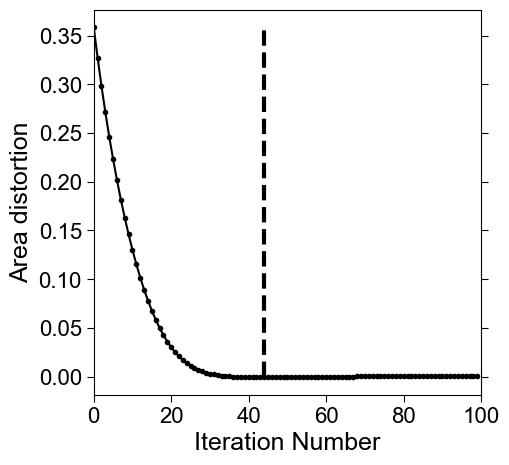

In [22]:
"""
Area distortion relaxation from conformal to equiareal.
"""
# For a single cell I like to set debugviz=True to check the flow is working, if the function is terminating much earlier than expected. The flow will not work if the input mesh doesn't support flow either because triangles are insufficiently large or if they are not near-equilateral
# debugviz=True will plot a histogram of the log(area distortion). If it is working the histogram should steadily converge to a symmetric distribution around 0. 
# If the plots don't converge see troubleshooting tips below.
relax_v, relax_f, area_distortion_iter= meshtools.area_distortion_flow_relax_sphere(conformal_sphere_mesh, 
                                                                                    S_ref_mesh, 
                                                                                    max_iter=100, # this needs to be increased the more S_ref deviates from spherical. 
                                                                                    delta=0.1, # controls the stiffness, if too high - there is no flow, if too low - bijectivity is lost and flow may breakdown 
                                                                                    stepsize=1, 
                                                                                    debugviz=False) 

# compute the evolution of the mean area distortion. We use this to determine the first iteration when area distortion is minimized. 
area_distortion_iter_curve = np.hstack([np.mean(mm) for mm in area_distortion_iter])

# to determine when area distortion is minimised we look for the timepoint when the sign first changes. This is because once the minimum is reached, depending on stepsize, the mesh will start to oscilate. The larger the stepsize, the faster the convergence but the larger the oscillatory instability. 
min_area_distort = (np.arange(len(area_distortion_iter_curve))[:-1])[np.sign(np.diff(area_distortion_iter_curve))>0][0] # falls below 0. 

# check: print the area distortion value at min_area_distort. This should be close to 1 (the ideal minimum) for optimal relaxation.
print('distortion at found iteration number:', area_distortion_iter_curve[min_area_distort])


# the area_distortion_iter_curve is another great check of things are working, we plot the np.log(curve) to visualize a log scale.
# the curve should go down smoothly, if the decay is bumpy etc, it means the mesh is not great, and can be improved 
import pylab as plt 

fig, ax = plt.subplots(figsize=(5,5))
plt.plot(np.arange(0,len(area_distortion_iter_curve)), np.log(area_distortion_iter_curve), '.-', color='k')
plt.vlines(min_area_distort, 
            np.nanmin(np.log(area_distortion_iter_curve)), 
            np.nanmax(np.log(area_distortion_iter_curve)), 'k', linestyles='dashed', lw=3)
plt.tick_params(length=5, right=True)
plt.xticks(fontsize=16, fontname='Arial')
plt.yticks(fontsize=16, fontname='Arial')
plt.xlim([0,len(area_distortion_iter_curve)])
plt.xlabel('Iteration Number', fontsize=18, fontname='Arial')
plt.ylabel('Area distortion', fontsize=18, fontname='Arial')
plt.savefig(os.path.join(savefolder, 
                          'area-distortion_relax_iterations_'+basefname.replace('.tif', '.svg')), bbox_inches='tight')
plt.show()

# create the equiareal mesh and save it out
equiareal_sphere_mesh = conformal_sphere_mesh.copy()
equiareal_sphere_mesh.vertices = relax_v[min_area_distort].copy()

tmp = equiareal_sphere_mesh.export(os.path.join(savefolder,
                                               'equiareal_sphere_param_Sref_%s.obj' %(basefname)))


#### 3. Quantifying and visualizing the conformal and equiareal distortion error during relaxation

Area distortion is computed as part of the relaxation process. Below, we compute the conformal error per iteration.

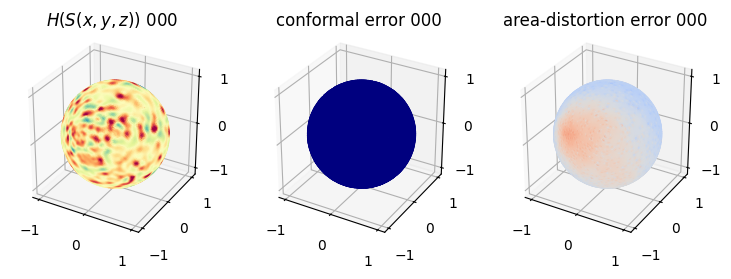

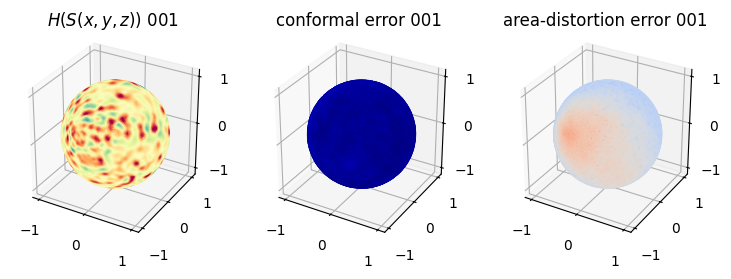

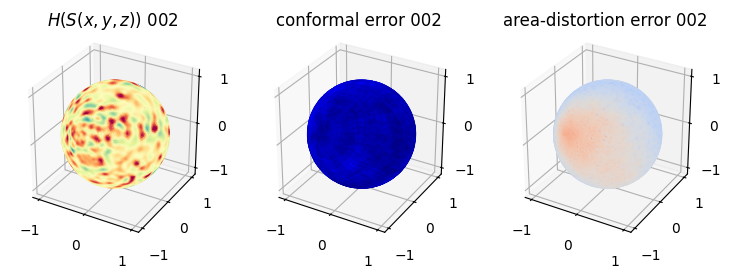

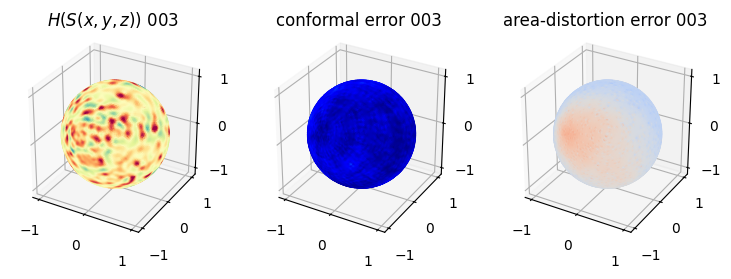

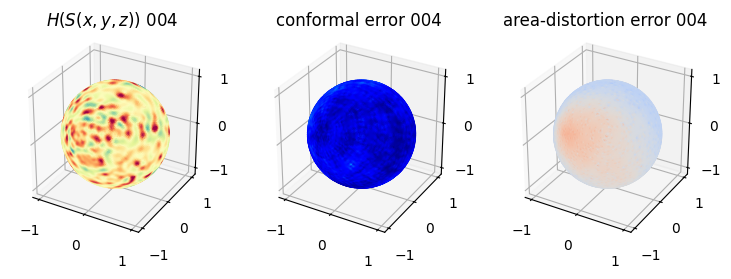

...

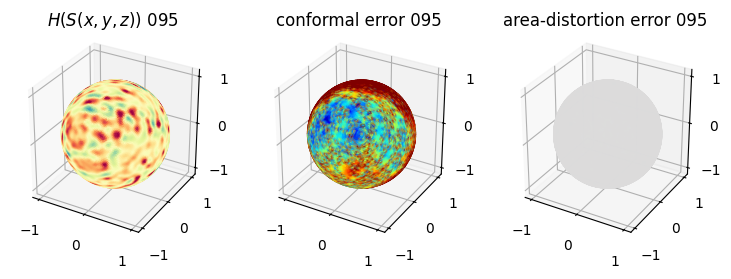

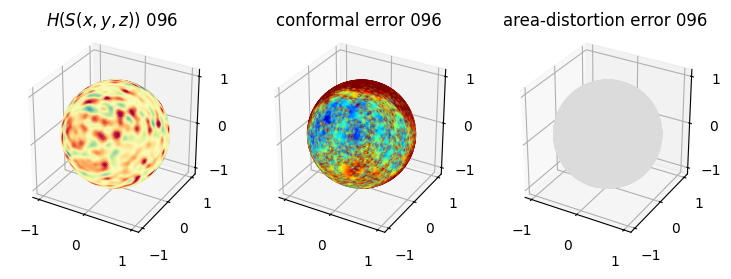

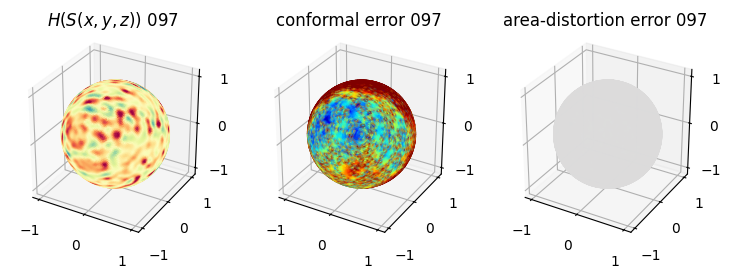

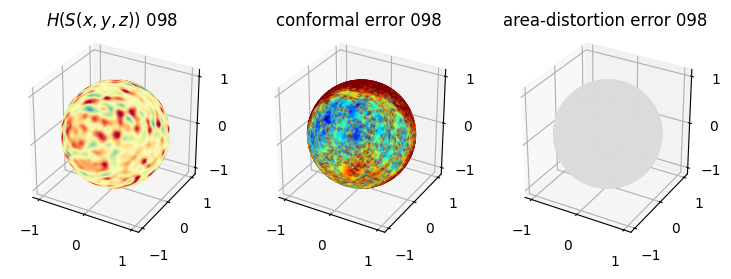

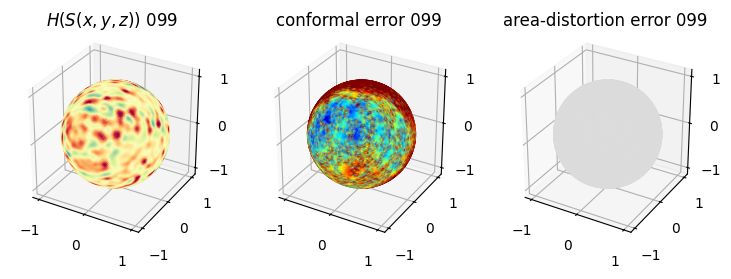

In [25]:
import unwrap3D.Visualisation.colors as vol_colors
import unwrap3D.Visualisation.plotting as plotting
from matplotlib import cm 
import pylab as plt 

"""
Compute the conformal error for each iteration of the relaxation and also color the resulting mesh. 
"""

save_area_relaxation_folder = os.path.join(savefolder, 'area_relaxation_iterations'); 
fio.mkdir(save_area_relaxation_folder)


# this will save both the conformal + equiareal error.
conformal_error_flow = []

for iter_ii in np.arange(len(area_distortion_iter)):

    # color by curvature
    relax_mesh_H = conformal_sphere_mesh.copy()
    relax_mesh_H.vertices = relax_v[iter_ii].copy()
    tmp = relax_mesh_H.export(os.path.join(save_area_relaxation_folder,
                                           'sphere_curvature_%s.obj' %(str(iter_ii).zfill(3))))

    # color by area distortion error
    area_distortion_error_colors = vol_colors.get_colors(np.log(area_distortion_iter[iter_ii]), 
                                                         colormap=cm.coolwarm, 
                                                         vmin=-3, vmax=3)
    relax_mesh_area_distort = meshtools.create_mesh(relax_v[iter_ii],
                                                    relax_f[iter_ii],
                                                    face_colors=np.uint8(255*area_distortion_error_colors[...,:3]))
    relax_mesh_area_distort.export(os.path.join(save_area_relaxation_folder,
                                                'sphere_area_distortion_%s.obj' %(str(iter_ii).zfill(3))))

    # measure and color by conformal error relative to the sphere at the start
    conformal_errors = meshtools.quasi_conformal_error(relax_v[0], 
                                                      relax_v[iter_ii], 
                                                      relax_f[iter_ii])
    conformal_error_flow.append(conformal_errors)

    conformal_error_color = vol_colors.get_colors(conformal_errors[1], # per face conformal error. 
                                                  colormap=cm.jet, 
                                                  vmin=1., vmax=1.5)
    relax_mesh_conformal_error = relax_mesh_area_distort.copy()
    relax_mesh_conformal_error.visual.face_colors = np.uint8(255*conformal_error_color)
    relax_mesh_conformal_error.export(os.path.join(save_area_relaxation_folder,
                                                   'sphere_conformal_error_%s.obj' %(str(iter_ii).zfill(3))))
    
    
    # matplotlib visualization of curvature, conformal error and area-distortion error.
    # you should see that as the area-distortion dissipates, conformal error increase
    sampling = 1 # plot every just so its not fully dense in the plot so we don't see anything!

    fig = plt.figure(figsize=(3*3,3))
    ax = fig.add_subplot(1,3,1, projection='3d')
    plt.title(r'$H(S(x,y,z)$) '+str(iter_ii).zfill(3))
    ax.scatter(relax_mesh_H.vertices[::sampling,2], 
               relax_mesh_H.vertices[::sampling,1],
               relax_mesh_H.vertices[::sampling,0], 
               s=1, 
               c=relax_mesh_H.visual.vertex_colors[::sampling,:3]/255.)
    plotting.set_axes_equal(ax)

    ax = fig.add_subplot(1,3,2, projection='3d')
    plt.title('conformal error '+str(iter_ii).zfill(3))
    ax.scatter(relax_mesh_conformal_error.vertices[::sampling,2], 
               relax_mesh_conformal_error.vertices[::sampling,1],
               relax_mesh_conformal_error.vertices[::sampling,0], 
               s=1, 
               c=relax_mesh_conformal_error.visual.vertex_colors[::sampling,:3]/255.)
    plotting.set_axes_equal(ax)

    ax = fig.add_subplot(1,3,3, projection='3d')
    plt.title('area-distortion error '+str(iter_ii).zfill(3))
    ax.scatter(relax_mesh_area_distort.vertices[::sampling,2], 
               relax_mesh_area_distort.vertices[::sampling,1],
               relax_mesh_area_distort.vertices[::sampling,0], 
               s=1, 
               c=relax_mesh_area_distort.visual.vertex_colors[::sampling,:3]/255.)
    plotting.set_axes_equal(ax)

    plt.show()
    
# reorganising the conformal error_flow from the relaxation process. 
conformal_error_flow_arrays = [ np.array([cc[jj] for cc in conformal_error_flow]) for jj in np.arange(len(conformal_error_flow[0]))]

#### 4. Plotting the mean conformal and equiareal error curve during relaxation

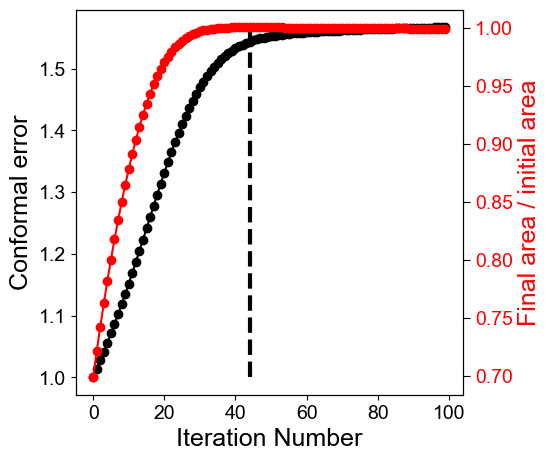

mean conformal distortion:  1.5438597268242185
mean area distortion:  0.9994166234636673


In [29]:
mean_conformal_curve = conformal_error_flow_arrays[2]
mean_area_distort_curve = np.array(area_distortion_iter).mean(axis=1)


import pylab as plt 

fig, ax1 = plt.subplots(figsize=(5,5))
ax1.set_xlabel('Iteration Number', fontsize=18, fontname='Arial')
ax1.set_ylabel('Conformal error', fontsize=18, fontname='Arial', color='k')
ax1.plot(np.arange(len(mean_conformal_curve)), mean_conformal_curve, 'ko-')
ax1.vlines(min_area_distort,1, np.nanmax(mean_conformal_curve), linestyles='dashed', color='k', lw=3)
ax1.tick_params(axis='y', labelcolor='k')
plt.xticks(fontname='Arial', fontsize=14)
plt.yticks(fontname='Arial', fontsize=14)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
ax2.set_ylabel('Final area / initial area', fontsize=18, color='r', fontname='Arial')  # we already handled the x-label with ax1
ax2.plot(np.arange(len(mean_area_distort_curve)), 1./mean_area_distort_curve, 'ro-')
ax2.tick_params(axis='y', labelcolor='r')
plt.xticks(fontname='Arial', fontsize=14)
plt.yticks(fontname='Arial', fontsize=14)
plt.tick_params(length=5)
plt.savefig(os.path.join(savefolder,  
                        'mean_area-relax_distortion_errors_iterations_'+basefname+'.png'), 
            bbox_inches='tight', dpi=300)
plt.show()
    
    
# print the mean errors
print('mean conformal distortion at selected iteration number: ', mean_conformal_curve[min_area_distort])
print('mean area distortion at selected iteration number ', np.nanmean(area_distortion_iter, axis=-1)[min_area_distort])


#### 5. The tradeoff between conformal and equiareal

You will notice a tradeoff between conformal and area distortion. Conceptually, this is because conformal is akin to 'rigid' transformation, triangles are not allowed to change shape, only rotate and rescale, area distortion is akin to 'nonrigid' transformation whereby inevitably the edge lengths and shapes of triangles are allowed to deform.

To make this explicit, we can plot the combined 'isometric' error proposed in the u-Unwrap3D paper, conformal + log(area distortion). It is then apparent that there exists a global minimum where both types of errors are minimized. (green dashed line). 

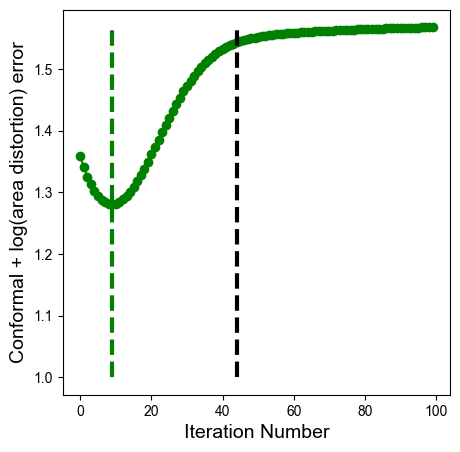

In [33]:
min_combined = np.argmin(mean_conformal_curve + np.log(mean_area_distort_curve))

# plotting combined conformal + log(area distortion) error
fig, ax = plt.subplots(figsize=(5,5))
ax.set_xlabel('Iteration Number', fontsize=14, fontname='Arial')
ax.set_ylabel('Conformal + log(area distortion) error', fontsize=14, fontname='Arial', color='k')
ax.plot(np.arange(len(mean_conformal_curve)), mean_conformal_curve + np.log(mean_area_distort_curve), 'go-')
ax.vlines(min_area_distort,1,np.nanmax(mean_conformal_curve + np.log(mean_area_distort_curve)), linestyles='dashed', color='k', lw=3) # this is the iteration number for equiareal
ax.vlines(min_combined,1,np.nanmax(mean_conformal_curve + np.log(mean_area_distort_curve)), linestyles='dashed', color='g', lw=3) # this is the iteration number for global minimum of conformal + equiareal
ax.tick_params(axis='y', labelcolor='k')
plt.xticks(fontname='Arial', fontsize=10)
plt.yticks(fontname='Arial', fontsize=10)
plt.show()

Generally, however for surface protrusions, at the iteration number that minimizes conformal and area distortion equally (dashed green), the area distortion relaxation is insufficient. Consequently we recommend to parameterize the isometric error with a weighting $\lambda$:
$$ \text{Isometric error}(\lambda) = (1-\lambda)\cdot \text{conformal} + \lambda \cdot \log \text{area distortion}$$
We plot the family of curves according to this hybrid error, showing how increasing $\lambda$ favors more equiareal, and decreasing $\lambda$ favors the initial conformal parameterization.

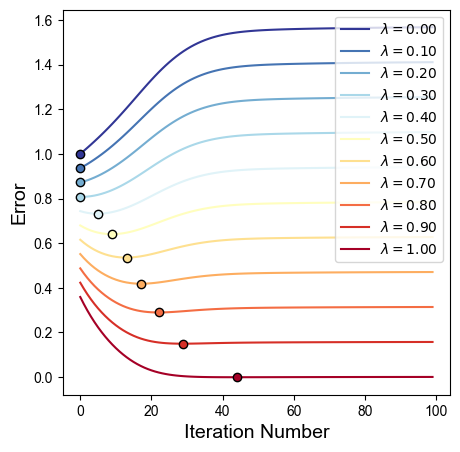

In [41]:
from matplotlib import cm
isometric_errors_curves = []

lams = np.linspace(0,1,10+1)
lams_min_iter = []
for lam in lams:
    isometric_errors_curve = (1.-lam)*mean_conformal_curve + lam*np.log(mean_area_distort_curve)
    isometric_errors_curves.append(isometric_errors_curve)
    lams_min_iter.append(np.argmin(isometric_errors_curve))

# isometric_errors_curves_colors = sns.color_palette('RdYlBu_r', len(isometric_errors_curves))
# isometric_errors_curves_colors = np.vstack(isometric_errors_curves_colors)
isometric_errors_curves_colors = vol_colors.get_colors(lams, 
                                                       colormap=cm.RdYlBu_r)

# plotting the curves 
fig, ax = plt.subplots(figsize=(5,5))
ax.set_xlabel('Iteration Number', fontsize=14, fontname='Arial')
ax.set_ylabel('Error', fontsize=14, fontname='Arial', color='k')
for lam_ii, lam_err_curve in enumerate(isometric_errors_curves):
    # plot curve
    ax.plot(np.arange(len(lam_err_curve)), lam_err_curve, '-', 
            color=isometric_errors_curves_colors[lam_ii], label=r'$\lambda=%.2f$' %(lams[lam_ii]))
    # plot minimum iteration number on curve
    ax.plot(lams_min_iter[lam_ii], 
            lam_err_curve[lams_min_iter[lam_ii]], 'o', 
            color=isometric_errors_curves_colors[lam_ii], mec='k')
ax.tick_params(axis='y', labelcolor='k')
plt.xticks(fontname='Arial', fontsize=10)
plt.yticks(fontname='Arial', fontsize=10)
plt.legend()
plt.show()

In [42]:
"""
Save all the computed measurements out 
"""
save_sphere_parametrization_mat = os.path.join(savefolder, 
                                                'Sref_area_relax_sphere.mat')
spio.savemat(save_sphere_parametrization_mat,
              {'relax_v':np.array(relax_v), 
              'relax_f': np.array(relax_f), 
              'area_distortion_iter': np.array(area_distortion_iter), # we have this saved.... (we want also the conformal area?)
              'min_area_distort_id':min_area_distort,
              'sphere_param': conformal_sphere_mesh.vertices, 
              'conformal_Jac_eigvals': conformal_error_flow_arrays[0], 
              'conformal_stretch_factors': conformal_error_flow_arrays[1], 
              'mean_conformal_stretch_factors': conformal_error_flow_arrays[2], 
              'conformal_tri_area_pairs': conformal_error_flow_arrays[3]})


#### Troubleshooting tips for area distortion relaxation

We have noticed several common occurrences of how the area distortion relaxation appears to fail, and how to address them here. 

##### 1. The function doesn't complete 1 iteration of relaxation and terminates early. 

*Reason*: the Lapacian matrix is likely singular or close to singular, and therefore cannot support matrix inversion for backwards Euler. This is likely one of or all of the following:

- at least one triangle face of your conformal spherical parameterization has interior angle close to $0^0$. Check by running `unwrap3D.Mesh.meshtools.measure_triangle_props`. The minimum angle of your mesh should be at least > $10^0$ (poor triangle quality)
- at least one triangle face of your conformal spherical parameterization has too small a surface area relative to floating point precision. Check by computing face area using `igl`, using the code `igl.doublearea(v,f)/2.` where `v` and `f` is the vertices and faces of the mesh respectively. 
- $S_{\text{ref}}(x,y,z)$ was not genus-0 or if it is, you have a thin neck or a 'plate-like' infill of a handle (if using shrinkwrapping)

*Fix*: recompute genus-0 $S_{\text{ref}}(x,y,z)$ from Step 1 and perform the conformal spherical map in Step 2 using the iterative method
- use `remesh_method='CGAL'` for isotropic remeshing to improve triangle quality in `unwrap3D.Mesh.meshtools.marching_cubes_mesh_binary` and that you have remesh active, i.e. `remesh=True` 
- use lower `remesh_samples` after voxelization with `unwrap3D.Mesh.meshtools.marching_cubes_mesh_binary` to generate a coarser mesh
- use a dilated voxelization i.e. set `ksize_dilate` at least greater than `ksize_erode` by 2.  

##### 2. Relaxation runs for XXX iterations, doesn't finish and area distortion at `min_area_distort` is much greater than 1.

*Reason*: There's two potential reasons:
 1) the shape or mesh of $S_{\text{ref}}(x,y,z)$ is preventing diffusion. $S_{\text{ref}}(x,y,z)$ likely has a diffusion-limiting geometry such as a thin neck or a 'plate-like' infill of a handle, or `remesh_samples` is too high, leading to too small a triangle area in the conformal spherical parameterization.
 2) `delta` is too high or too low. `delta` governs 'stiffness' between edges. If you have a densely sampled mesh, i.e. lots of vertices `delta=0.1` may be too high, and there is barely any relaxation. The triangle area also internally limits the diffusion step size. Check by setting `debugviz=True`. The histogram bars should noticeably shift lower every iteration. If not, its a sign of too high a `delta`. Similarly, if `delta` is too low, its hard for neighboring vertices to maintain connectivity (move together). This often leads to visible 'wiggles' when plotting the `area_distortion_iter_curve` curve.     

 *Fix*:

 1) recompute genus-0 $S_{\text{ref}}(x,y,z)$ from Step 1 and perform the conformal spherical map in Step 2 using the iterative method as for troubleshooting 1 above i.e. use `remesh_method='CGAL'`, use lower `remesh_samples` (drop `min_mesh_size` too accordingly), set `ksize_dilate`>`ksize_erode` to widen geometry features. Generally, you will spot problematic geometry because the `area_distortion_iter_curve` will not go down smoothly - it should show monotoniic linear decrease then plateau as it hits the minimum, as for the example here. Critically the first part whilst its minimizing is smooth.  
 2) start with `delta=0.1` go down as `delta=0.05, 0.01, 0.005, 0.001 etc.`. If its not improving, try setting `lloyd_relax_bool=True` - this performs [lloyd relaxation](https://en.wikipedia.org/wiki/Lloyd%27s_algorithm) of the mesh every `lloyd_every_iter` iterations to help improve triangle quality during the flow. This is most helpful for densely sampled meshes.  

##### 3. Cannot find automatically `min_area_distort`

*Reason*: `min_area_distort` is computed by observing the sign change when the `area_distortion_iter_curve` first changes sign from negative to positive. This assumes you run iterations after full convergence. There is two reasons if the other two troubleshooting do not apply:
1) $S_{\text{ref}}(x,y,z)$ is essentially spherical or close to. In this case conformal = equiareal parameterization. Therefore there is no need to relax.
2) the relaxation has yet to converge. If `stepsize=1` already, then increase `max_iter`. The larger the deviation of $S_{\text{ref}}(x,y,z)$ is from a sphere, the greater the `max_iter` required. Particulary for elongated structures, its not unusual to set `max_iter=1000`.
